In [1]:
import pandas as pd
import numpy as np
import os
# from sage.symbolic.substitution_map import make_map
#import sympy as sp
from sympy import *
import matplotlib.pyplot as plt
%matplotlib inline
from plotly import graph_objects as go
import plotly.express as px
from IPython.display import Image
import seaborn as sns
sns.set(font='Franklin Gothic Book',
        rc={
 'axes.axisbelow': False,
 'axes.edgecolor': 'lightgrey',
 'axes.facecolor': 'None',
 'axes.grid': False,
 'grid.color':'#D5D5D5',
 'axes.labelcolor': 'dimgrey',
 'axes.spines.right': False,
 'axes.spines.top': False,
 'figure.facecolor': '#FEFCFB',
 'lines.solid_capstyle': 'round',
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'text.color': 'dimgrey',
 'xtick.bottom': False,
 'xtick.color': 'dimgrey',
 'xtick.direction': 'out',
 'xtick.top': False,
 'ytick.color': 'dimgrey',
 'ytick.direction': 'out',
 'ytick.left': False,
 'ytick.right': False})
sns.set_context("notebook", rc={"font.size":16,
                                "axes.titlesize":20,
                                "axes.labelsize":18})

In [2]:
L = np.array([3000, 4500, 4000, 5000, 6150, 4000])
Z = np.array([L[0], L[0] + L[1], L[0]+L[1]+L[2], L[0]+L[1]+L[2]+L[3], L[0]+L[1]+L[2]+L[3]+L[4], L[0]+L[1]+L[2]+L[3]+L[4]+L[5]])
Z

array([ 3000,  7500, 11500, 16500, 22650, 26650])

# Flessione

In [3]:
# Mmax = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmax.txt') #Linux
Mmax = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmax.txt') #Windows
# Mmin = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmin.txt') #Linux
Mmin = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmin.txt')#Windows
# MEd_slu = pd.read_csv('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/MEd_slu.csv') #Linux
MEd_slu = pd.read_csv('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\MEd_slu.csv')#Windows
# MEd_slu.to_latex('MEd_slu.tex')
MEd_slu

,Section,MEd+ [kN m],smax [m],MEd- [kN m],smin [m]
0,C1,95.189448,1.26,NaN,NaN
1,N2,NaN,NaN,-199.249367,3.00
2,C2,156.565614,5.32,0.000000,NaN
3,N3,NaN,NaN,-216.792778,7.50
4,C3,124.347537,9.55,-39.690612,9.47
5,N4,NaN,NaN,-210.348968,11.50
6,C4,151.829401,13.96,-6.190556,13.74
7,N5,NaN,NaN,-236.629193,16.50
8,C5,144.511198,19.56,0.000000,NaN
9,N6,NaN,NaN,-187.959174,22.65


In [4]:
smax = MEd_slu[['smax [m]']].to_numpy()
smin = MEd_slu[['smin [m]']].to_numpy()

smaxmin = np.sort((np.concatenate((smax, smin))).reshape(-1))
smaxmin = np.insert(smaxmin, -1, 26.65)

#ss is for plot
ss=smaxmin
for i in range (0, len(ss)-1):
    if ss[i+1] - ss[i] < 0.5:
        ss[i] = ss[i+1]
        
ss = pd.Series(ss).fillna(method='ffill') 
ss = ss.drop_duplicates()

In [5]:
MEd = np.array([95.189448, 199.249367, 156.565614, 216.792778, 124.347537, 
#                 39.690612,
                210.348968, 151.829401,
#                 6.190556,
                236.629193, 144.511198, 187.959174, 87.580801])
MEd

array([ 95.189448, 199.249367, 156.565614, 216.792778, 124.347537,
       210.348968, 151.829401, 236.629193, 144.511198, 187.959174,
        87.580801])

In [6]:
s = np.arange(0,26.65, .001)
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = s,
    y = Mmax,
    name='M+',
    line_color='#7FA5A5',
    showlegend=False,
    line = dict(width=1)
))

fig.add_trace(go.Scatter(
    x = s,
    y = Mmin,
    name='M-',
    line_color='#7FA5A5',
    fill='tonexty',
    showlegend=False,
    line = dict(width=1)
))


# fig.add_trace(go.Scatter(
#     x = s, 
#     y = -247.64*np.ones(len(s)),
#     legendgroup='6',
#     name='6ϕ18',
#     line_color='green'
# ))

# fig.add_trace(go.Scatter(
#     x = s, 
#     y = 86*np.ones(len(s)),
#     legendgroup='2',
#     name='2ϕ18',
#     line_color='red'
# ))


fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLU'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=ss,
        ticktext=ss,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 50,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)

# fig.write_image("export/img/bendingMoment_C5_slu.pdf")

fig.update_yaxes(automargin=True)
fig.show()

NoSuchProcess: psutil.NoSuchProcess no process found with pid 88492

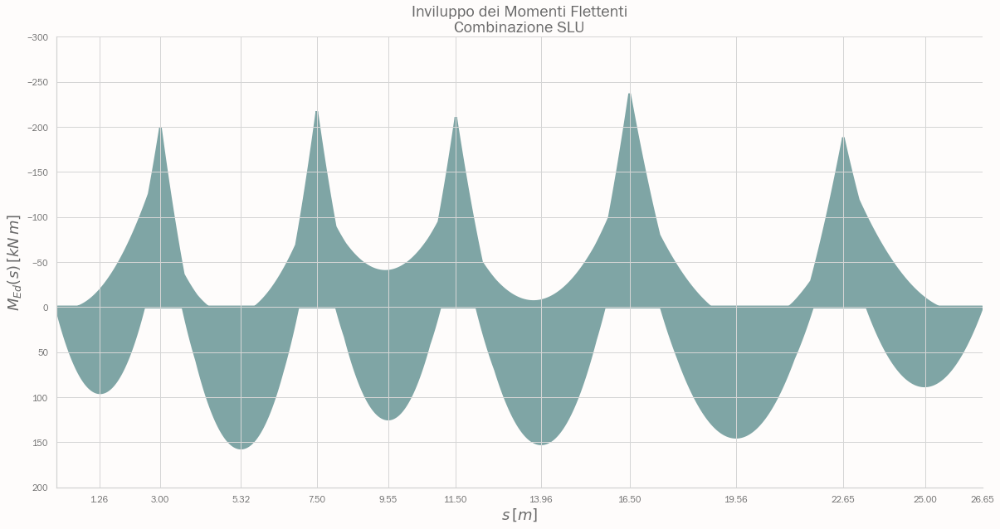

In [7]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Mmin, linewidth='3', color='#7FA5A5')
plt.xlim(s.min(), s.max())
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$')
plt.ylabel(r'$M_{Ed}(s)\,[kN\,m]$')
plt.xticks(ss)
plt.yticks(np.arange(-300, 250, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
#plt.savefig('export/img/bendingMomentEnvelopeBeam_slu.eps')
plt.show()

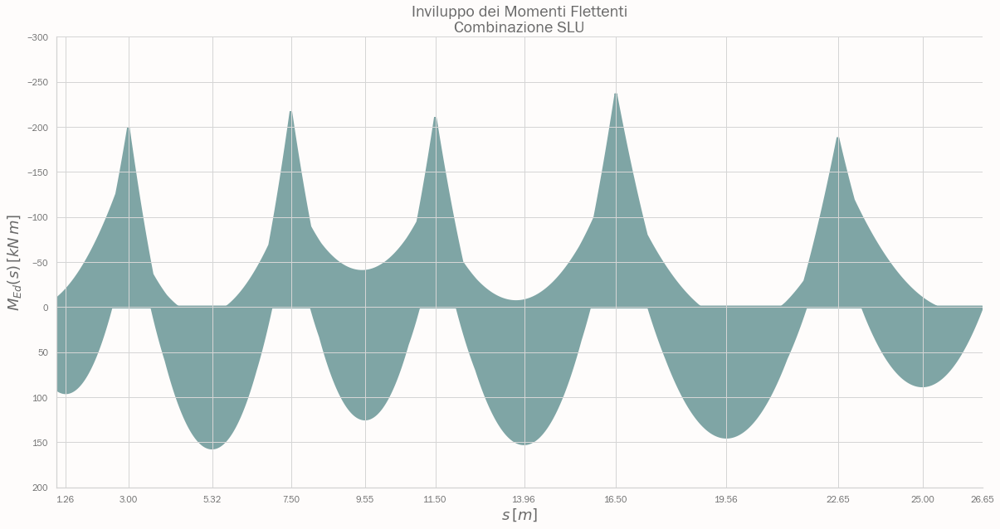

In [8]:
s = np.arange(0,26.65, .001)
fig, ax = plt.subplots(figsize=(20,10))
plt.fill(s, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Mmin, linewidth='3', color='#7FA5A5')
ax.set_xlim(1,10)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$')
plt.ylabel(r'$M_{Ed}(s)\,[kN\,m]$')
plt.xticks(ss)
plt.yticks(np.arange(-300, 250, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
#plt.savefig('export/img/bendingMomentEnvelopeBeam_slu.eps')
plt.show()

---
## Progetto
### Sezione maggiormante sollecitata

In [9]:
beta, psi, xi, d, As, mylambda, x, A1s, epsilons, epsilon1s, sigmas, sigma1s, M, Phi = symbols('beta, psi, xi, d, As, mylambda, x, A1s, epsilons, epsilon1s, sigmas, sigma1s, M, Phi')


In [10]:
fck = 25;
alphacc = .85
gammac = 1.5
fcd = round(fck*alphacc/gammac,2)
epsilonc2 = 2/1000
epsiloncu = 3.5/1000
fcm = fck + 8
Ecm = round(22000*(fcm/10)**(0.3))
#------------
fyk = 450
gammas = 1.15
fyd = round(fyk/gammas,2)
Es = 210*10**3
epsilonse = fyd/Es
epsilonsu = 10/1000
#------------------
b = 300;
beta0 = .3
d1 = 40
d2 = 40
psi23 = .80952
mylambda23 = .416
xi23 = .2593

xi2a2b = .23034
psi2u = 1-1/3 * epsilonc2/epsilonsu * (1-xi)/xi
mylambda2u = ((6*epsilonsu**2+4*epsilonsu*epsilonc2 + epsilonc2**2)*xi**2 - 2*epsilonc2**2 *xi + epsilonc2**2 - 4*epsilonsu*epsilonc2*xi)/(4*epsilonsu*xi*((3*epsilonsu+epsilonc2)*xi-epsilonc2))

psi2 = xi/(1-xi) * epsilonsu/(3*epsilonc2**2) * (3*epsilonc2 - xi/(1-xi)*epsilonsu)
mylambda2 = (4*epsilonc2-epsilonsu*xi/(1-xi))/(4*(3*epsilonc2-epsilonsu*xi/(1-xi)))


#-------------------SLE-----------------------
n = 15;
sigmacR_rara = 0.6*fck
sigmacR_qp = .45*fck
sigmasR_rara = .8*fyk

In [11]:
eqtd = b*psi*xi*d*fcd + beta*As*sigma1s - As*sigmas
eqrd = b*psi*xi*d**2*fcd*(1-mylambda*xi) + beta*As*sigma1s*(d-d2) - M*10**6

In [12]:
eqtd

As*beta*sigma1s - As*sigmas + 4251.0*d*psi*xi

In [13]:
eqrd

As*beta*sigma1s*(d - 40) - 1000000*M + 4251.0*d**2*psi*xi*(-mylambda*xi + 1)

In [14]:
len(MEd)

11

In [15]:
As00 = (solve(eqtd, As)[0]).subs({psi:psi23, xi:xi23, sigmas:fyd, sigma1s:fyd, beta:beta0})
d0 = (solve(eqrd.subs({As:As00}), d)[1]).subs({psi:psi23, xi:xi23, sigma1s:fyd, mylambda:mylambda23, M:max(MEd),beta:beta0})

print(As00, '\n',d0,'\n', As00.subs({d:d0}), '\n', As00.subs({d:d0})/3)

3.25771671912672*d 
 454.633018954673 
 1481.06558691569 
 493.688528971897


In [16]:
d0 = ceiling((d0+d1)/10)*10 - d1
d0

460

In [17]:
N(162*pi)

508.938009881547

In [18]:
As0 = np.zeros(len(MEd))
As0[np.argmax(MEd)] = As00.subs({d:d0})
As0.max()

1498.549690798291

Si scelgono $\Phi 18\,mm$

In [19]:
k = symbols('k')
Phi0 = 18
nums = 0*As0
num1s = 0*nums

for i in range(len(As0)):
    nums[i] = ceiling((float(solve(k*pi*Phi0**2 /4 - As0[i], k)[0])))
    
def area(Phi):
    return pi*Phi**2 /4

As0 = area(Phi0)*nums

A1s0 = As0 * beta0
for i in range(len(As0)):
    num1s[i] = ceiling(solve(k*area(Phi0) - A1s0[i], k)[0])
A1s0 = area(Phi0)*num1s
A1s0

array([0, 0, 0, 0, 0, 0, 0, 162.0*pi, 0, 0, 0], dtype=object)

### Tutte le altre sezioni

In [20]:
eqrd1 = b*psi*xi*d*fcd*(mylambda*xi*d - d2) - As*sigmas*(d-d2) + M*10**6
As00 = np.zeros(len(MEd))
nums = 0*As0

for i in range (len(MEd)):
    As00[i] = (solve(eqrd1, As)[0]).subs({d:d0, psi:psi23, xi:xi23, sigmas:fyd, mylambda:mylambda23, M:MEd[i]})
    nums[i] = ceiling(solve(k*area(Phi0) - As00[i], k)[0])
    if nums[i] < 2:
        nums[i] = 2;
print(As00,'\n', nums)




[ 603.2273571  1236.4032117   976.68436853 1343.15002026  780.64627207
 1303.94121688  947.86582107 1463.84912459  903.33657789 1167.70550686
  556.93084243] 
 [3 5 4 6 4 6 4 6 4 5 3]


In [21]:
.3*As00

array([180.96820713, 370.92096351, 293.00531056, 402.94500608,
       234.19388162, 391.18236507, 284.35974632, 439.15473738,
       271.00097337, 350.31165206, 167.07925273])

In [22]:
MEd

array([ 95.189448, 199.249367, 156.565614, 216.792778, 124.347537,
       210.348968, 151.829401, 236.629193, 144.511198, 187.959174,
        87.580801])

L'area dell'armatura tesa è

In [23]:
As0 = area(Phi0) * nums
Matrix(As0)

Matrix([
[243*pi],
[405*pi],
[324*pi],
[486*pi],
[324*pi],
[486*pi],
[324*pi],
[486*pi],
[324*pi],
[405*pi],
[243*pi]])

In [24]:
A1s00 = np.zeros(len(MEd))
num1s = 0*nums
for i in range (len(MEd)):
    A1s00[i] = (solve(eqrd, As)[0]).subs({beta:1, d:d0, psi:psi23, xi:xi23, sigma1s:fyd, mylambda:mylambda23, M:MEd[i]})
    num1s[i] = ceiling(solve(k*area(Phi0) - A1s00[i], k)[0])
    if num1s[i] < 2:
        num1s[i] = 2;
print(A1s00,'\n', num1s)

[-445.75742646  187.41842814  -72.30041503  294.1652367  -268.33851149
  254.95643333 -101.11896249  414.86434103 -145.64820567  118.7207233
 -492.05394113] 
 [2 2 2 2 2 2 2 2 2 2 2]


L'area dell'armatura compressa è

In [25]:
A1s0 = area(Phi0) * num1s
Matrix(A1s0)

Matrix([
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi],
[162*pi]])

Verifica se l'armatura è sufficiente:
$$
A_{s, min} = max\left\{0.26\,\dfrac{f_{ctm}}{f_{yk}}\,b_t\cdot d; 0.0013\,b_t\cdot d\right\}
$$

In [26]:
fctm = .3*fck**(2/3)
fctm

2.564963920015045

In [27]:
Asmin = max(.26*fctm/fyk * b*d0, .0013*b*d0)
Asmin

204.513123222533

In [28]:
min(As0) > Asmin

True

In [29]:
min(A1s0) > Asmin

True

OK!

Verificare che l'armatura si minore di
$$
A_{s,max} = 0.04\cdot A_c
$$
dove 
$$ A_c = b\cdot h$$

In [30]:
Asmax = .04*b*(d0+d1)
Asmax

6000.00000000000

In [31]:
max(As0) < Asmax

True

In [32]:
max(A1s0) < Asmax

True

OK!

Verifica se le barre stanno nella sezione di base $b=300\,mm$.

Ipotizzando un diametro massimo dell'inerte di $20\,mm$:
$$
s_{min} = max\left\{k_1\cdot \Phi_l ; d_g + k_2; 20\,mm\right\}
$$
dove, dal NAD $k_1 = 1$ e $k_2 = 5\,mm$

In [33]:
max(1*Phi0, 20+5, 20)

25

Allora, considerando delle staffe $\Phi_{st} = 10\,mm$ e un copriferro di $20\,mm$

In [34]:
2*20 + 2*10 + max(nums) * Phi0 + (max(nums)-1)*25 

293

che è minore di $300\,mm$. OK!

---
## Verifica

In [35]:
eqt = b*psi*xi*d*fcd + A1s*sigma1s - As*sigmas
eqr = b*psi*xi*d**2*fcd*(1-mylambda*xi) + A1s*sigma1s*(d-d2) - M*10**6
xid = np.zeros(len(MEd))
epsilonc = np.zeros(len(MEd))

for i in range (len(MEd)):
    xid[i] = (N((solve(eqt, xi)[0]).subs({psi:psi23, d:d0, A1s:A1s0[i], sigma1s:fyd, sigmas:fyd, As:As0[i]})))
    if xid[i] < xi23:
        print(i+1,':\n','Ipotesi di campo 3 errata! La sezione è in campo 2.Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2\n') 
        xid[i] = (N((solve(eqt.subs({psi:psi2u}), xi)[0]).subs({ d:d0, A1s:A1s0[i], sigma1s:fyd, sigmas:fyd, As:As0[i]})))
        epsilonc[i] = epsilonsu * xid[i]/(1-xid[i])
        if epsilonc[i] < epsilonc2:
            print('Ipotesi sul campo deformativo del cls errata!\tDifferenza:',epsilonc[i]-epsilonc2,'\n')
            xid[i] = re(N((solve(eqt.subs({psi:psi2}), xi)[0]).subs({ d:d0, A1s:A1s0[i], sigma1s:fyd, sigmas:fyd, As:As0[i]})))
        if xid[i] > xi2a2b and xid[i] < xi23:
            print('Ipotesi di campo 2b corretta. Le armature compresse sono snervate.\n')
        elif xid[i] < xi2a2b:
            print('Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!\n')
            xid[i] = N(solve(eqt.subs({psi:psi2u, d:d0, A1s:A1s0[i], sigma1s:Es*epsilonsu*(xi-d2/d0)/(1-xi), As:As0[i], sigmas:fyd}), xi)[0])
            epsilonc[i] = epsilonsu * xid[i]/(1-xid[i])
            if epsilonc[i] < epsilonc2:
                xid[i] = re(N(solve(eqt.subs({psi:psi2, d:d0, A1s:A1s0[i], sigma1s:Es*epsilonsu*(xi-d2/d0)/(1-xi), As:As0[i], sigmas:fyd}), xi)[1]))
                print('Ipotesi sul campo deformativo del cls errata!\tDifferenza:',epsilonc[i]-epsilonc2,'\n')
            if xid[i] > xi2a2b:
                print('Verifica la deformazione del cls!\n')
    elif xid[i] >= xi23:
        print('Ipotesi di campo 3 corretta')
        
Matrix(xid)

1 :
 Ipotesi di campo 3 errata! La sezione è in campo 2.Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.0007610354992457419 

Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!

Ipotesi sul campo deformativo del cls errata!	Differenza: -8.535889318326065e-05 

2 :
 Ipotesi di campo 3 errata! La sezione è in campo 2.Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!

3 :
 Ipotesi di campo 3 errata! La sezione è in campo 2.Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.00012384508666542162 

Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!

4 :
 Ipotesi di campo 3 errata! La sezione è in campo 2.Ipot

Matrix([
[0.160694044934078],
[0.216484184604169],
[0.188989066769715],
[0.253453257098057],
[0.188989066769715],
[0.253453257098057],
[0.188989066769715],
[0.253453257098057],
[0.188989066769715],
[0.216484184604169],
[0.160694044934078]])

La deformazione del calcestruzzo al lembo superiore è

In [36]:
Matrix(epsilonc)

Matrix([
[0.00191464110681674],
[0.00276298423529334],
[0.00233029000012323],
[ 0.0033950085444462],
[0.00233029000012323],
[ 0.0033950085444462],
[0.00233029000012323],
[ 0.0033950085444462],
[0.00233029000012323],
[0.00276298423529334],
[0.00191464110681674]])

In [37]:
10* ((xid[0] - 40/460)/(1-xid[0]))

0.8785535566604662

In [38]:
(16*xid[2] - 1)/(15*xid[2])

0.713912574558784

### Momenti resistenti 

In [39]:
MRd_pos = np.zeros(len(xid))

for i in range (len(xid)):
    if xid[i] >= xi23 and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_pos[i] = (N(solve(eqr.subs({psi:psi23, xi:xid[i], d:d0, mylambda:mylambda23, A1s:A1s0[i], sigma1s:fyd, As:As0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))
    elif xid[i] < xi23 and xid[i] > xi2a2b and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_pos[i] = (N(solve(eqr.subs({psi:psi2u, xi:xid[i], d:d0, mylambda:mylambda2u, A1s:A1s0[i], sigma1s:fyd, As:As0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))
    elif xid[i] < xi2a2b and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_pos[i] = (N(solve(eqr.subs({psi:psi2u, xi:xid[i], d:d0, mylambda:mylambda2u, A1s:A1s0[i], sigma1s:Es*epsilonsu*(xid[i] - d2/d0)/(1-xid[i]), As:As0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))
    elif xid[i] < xi23 and xid[i] > xi2a2b and epsilonc[i] < epsilonc2:
        MRd_pos[i] = (N(solve(eqr.subs({psi:psi2, xi:xid[i], d:d0, mylambda:mylambda2, A1s:A1s0[i], sigma1s:fyd, As:As0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))  
    elif xid[i] < xi2a2b and epsilonc[i] < epsilonc2:
        MRd_pos[i] = (N(solve(eqr.subs({psi:psi2, xi:xid[i], d:d0, mylambda:mylambda2, A1s:A1s0[i], sigma1s:Es*epsilonsu*(xid[i] - d2/d0)/(1-xid[i]), As:As0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))

Matrix(MRd_pos)

Matrix([
[128.017743479862],
[209.205097776342],
[168.992537358972],
[247.641544543623],
[168.992537358972],
[247.641544543623],
[168.992537358972],
[247.641544543623],
[168.992537358972],
[209.205097776342],
[128.017743479862]])

### Momenti resistenti sezione invertita

In [40]:
for i in range (len(MEd)):
    xid[i] = (N((solve(eqt, xi)[0]).subs({psi:psi23, d:d0, A1s:As0[i], sigma1s:fyd, sigmas:fyd, As:A1s0[i]})))
    if xid[i] < xi23:
        print(i+1,':\n','Ipotesi di campo 3 errata! La sezione è in campo 2. Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2\n') 
        xid[i] = (N((solve(eqt.subs({psi:psi2u}), xi)[0]).subs({ d:d0, A1s:As0[i], sigma1s:fyd, sigmas:fyd, As:A1s0[i]})))
        epsilonc[i] = epsilonsu * xid[i]/(1-xid[i])
        if epsilonc[i] < epsilonc2:
            print('Ipotesi sul campo deformativo del cls errata!\tDifferenza:',epsilonc[i]-epsilonc2,'\n')
            xid[i] = re(N((solve(eqt.subs({psi:psi2}), xi)[0]).subs({ d:d0, A1s:As0[i], sigma1s:fyd, sigmas:fyd, As:A1s0[i]})))
        if xid[i] > xi2a2b and xid[i] < xi23:
            print('Ipotesi di campo 2b corretta. Le armature compresse sono snervate.\n')
        elif xid[i] < xi2a2b:
            print('Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!\n')
            xid[i] = N(solve(eqt.subs({psi:psi2u, d:d0, A1s:As0[i], sigma1s:Es*epsilonsu*(xi-d2/d0)/(1-xi), As:A1s0[i], sigmas:fyd}), xi)[0])
            epsilonc[i] = epsilonsu * xid[i]/(1-xid[i])
            if epsilonc[i] < epsilonc2:
                xid[i] = re(N(solve(eqt.subs({psi:psi2, d:d0, A1s:As0[i], sigma1s:Es*epsilonsu*(xi-d2/d0)/(1-xi), As:A1s0[i], sigmas:fyd}), xi)[1]))
                print('Ipotesi sul campo deformativo del cls errata!\tDifferenza:',epsilonc[i]-epsilonc2,'\n')
            if xid[i] > xi2a2b:
                print('Verifica la deformazione del cls!\n')
    elif xid[i] >= xi23:
        print('Ipotesi di campo 3 corretta')

1 :
 Ipotesi di campo 3 errata! La sezione è in campo 2. Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.0018501714203394992 

Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.0005744305242395518 

2 :
 Ipotesi di campo 3 errata! La sezione è in campo 2. Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.002746866168174395 

Ipotesi di campo 2b errata! La sezione è in campo 2a con armature compresse in campo elastico!

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.0006883459725246528 

3 :
 Ipotesi di campo 3 errata! La sezione è in campo 2. Ipotesi di campo 2b (armatura compressa snervata) con epsilon_c > epsilon_c2

Ipotesi sul campo deformativo del cls errata!	Differenza: -0.00231923886

In [41]:
Matrix(xid)

Matrix([
[0.124059577321618],
[0.115003327340289],
[0.118913606969516],
[0.111934548584534],
[0.118913606969516],
[0.111934548584534],
[0.118913606969516],
[0.111934548584534],
[0.118913606969516],
[0.115003327340289],
[0.124059577321618]])

In [42]:
epsilon_1s = np.zeros(len(xid))
for i in range (len(xid)):
    epsilon_1s [i]= epsilonsu*(xid[i] - d2/d0)/(1-xid[i])

Matrix(epsilon_1s)

Matrix([
[0.000423579670738757],
[0.000316914249144782],
[0.000362700927890501],
[0.000281263355145635],
[0.000362700927890501],
[0.000281263355145635],
[0.000362700927890501],
[0.000281263355145635],
[0.000362700927890501],
[0.000316914249144782],
[0.000423579670738757]])

In [43]:
xid[2]/(1-xid[2]) * 10/12 * (6 - xid[2]/(1-xid[2])*10)

0.5230218153611884

In [44]:
(8 - 10*xid[2]/(1-xid[2]))/(4*(6-10*xid[2]/(1-xid[2])))

0.35751820686905844

In [45]:
MEd

array([ 95.189448, 199.249367, 156.565614, 216.792778, 124.347537,
       210.348968, 151.829401, 236.629193, 144.511198, 187.959174,
        87.580801])

In [46]:
MRd_neg = np.zeros(len(xid))

for i in range (len(MRd_neg)):
    if xid[i] >= xi23 and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_neg[i] = (N(solve(eqrd1.subs({psi:psi23, xi:xid[i], d:d0, mylambda:mylambda23, A1s:As0[i], sigma1s:fyd, As:A1s0[i], sigmas:fyd}), M)[1].subs({xi:xid[i]})))
    elif xid[i] < xi23 and xid[i] > xi2a2b and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_neg[i] = (N(solve(eqrd1.subs({psi:psi2u, xi:xid[i], d:d0, mylambda:mylambda2u, A1s:As0[i], sigma1s:fyd, As:A1s0[i], sigmas:fyd}), M)[1].subs({xi:xid[i]})))
    elif xid[i] < xi2a2b and epsilonc[i] > epsilonc2 and epsilonc[i] < epsiloncu:
        MRd_neg[i] = (N(solve(eqrd1.subs({psi:psi2u, xi:xid[i], d:d0, mylambda:mylambda2u, A1s:As0[i], sigma1s:Es*epsilonsu*(xid[i] - d2/d0)/(1-xid[i]), As:A1s0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))
    elif xid[i] < xi23 and xid[i] > xi2a2b and epsilonc[i] < epsilonc2:
        MRd_neg[i] = (N(solve(eqrd1.subs({psi:psi2, xi:xid[i], d:d0, mylambda:mylambda2, A1s:As0[i], sigma1s:fyd, As:A1s0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))  
    elif xid[i] < xi2a2b and epsilonc[i] < epsilonc2:
        MRd_neg[i] = (N(solve(eqrd1.subs({psi:psi2, xi:xid[i], d:d0, mylambda:mylambda2, A1s:As0[i], sigma1s:Es*epsilonsu*(xid[i] - d2/d0)/(1-xid[i]), As:A1s0[i], sigmas:fyd}), M)[0].subs({xi:xid[i]})))

Matrix(MRd_neg)

Matrix([
[86.2021912782463],
[86.0626787358224],
[86.1282573309843],
[86.0060036033127],
[86.1282573309843],
[86.0060036033127],
[86.1282573309843],
[86.0060036033127],
[86.1282573309843],
[86.0626787358224],
[86.2021912782463]])

In [47]:
Matrix(epsilonc)

Matrix([
[0.00142556947576045],
[0.00131165402747535],
[0.00136069080549896],
[0.00127323900317707],
[0.00136069080549896],
[0.00127323900317707],
[0.00136069080549896],
[0.00127323900317707],
[0.00136069080549896],
[0.00131165402747535],
[0.00142556947576045]])

In [48]:
MRd_pos > MEd

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

In [49]:
(np.array(CB91_Grad_BP[n]) for n in range(0,len(np.unique(MRd_pos[0::2]))))
    

<generator object <genexpr> at 0x000002682A5B33C0>

In [50]:
CB91_Grad_BP = ['#2cbdfe', '#2fb9fc', '#33b4fa', '#36b0f8',
                '#3aacf6', '#3da8f4', '#41a3f2', '#449ff0',
                '#489bee', '#4b97ec', '#4f92ea', '#528ee8',
                '#568ae6', '#5986e4', '#5c81e2', '#607de0',
                '#6379de', '#6775dc', '#6a70da', '#6e6cd8',
                '#7168d7', '#7564d5', '#785fd3', '#7c5bd1',
                '#7f57cf', '#8353cd', '#864ecb', '#894ac9',
                '#8d46c7', '#9042c5', '#943dc3', '#9739c1',
                '#9b35bf', '#9e31bd', '#a22cbb', '#a528b9',
                '#a924b7', '#ac20b5', '#b01bb3', '#b317b1']

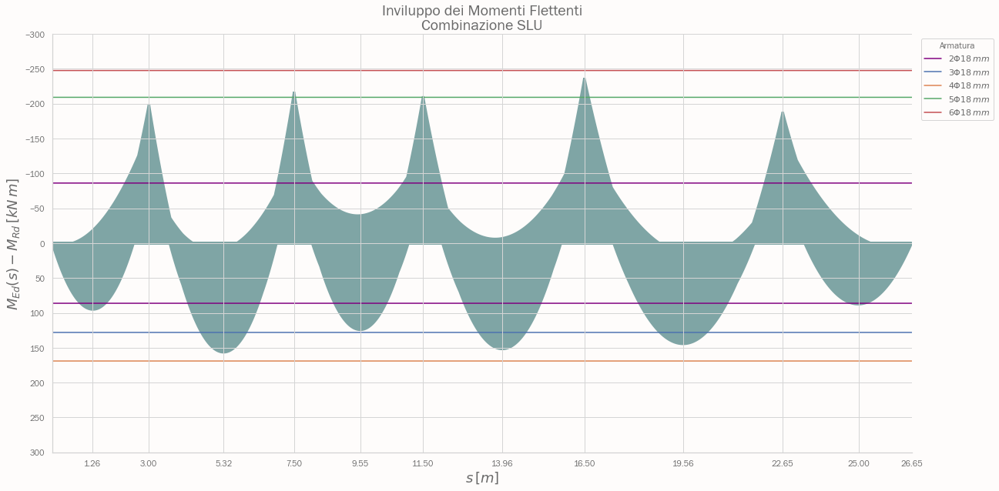

In [51]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Mmin, linewidth='3', color='#7FA5A5')

plt.plot(s, max(MRd_neg)*np.ones(len(s)), color='purple', label=r'$2\Phi 18\,mm$')
plt.plot(s, -max(MRd_neg)*np.ones(len(s)), color='purple')

labels = [r'$3\Phi 18\,mm$', r'$4\Phi 18\,mm$']
labels1 = [r'$5\Phi 18\,mm$', r'$6\Phi 18\,mm$']


for y_arr, label in zip(np.unique(MRd_pos[0::2]), labels):
    plt.plot(s,y_arr*np.ones(len(s)), label=label,)
    
    
for y_arr, label in zip(np.unique(MRd_pos[1::2]), labels1):
    plt.plot(s,-y_arr*np.ones(len(s)), label=label)



plt.legend(bbox_to_anchor=(1.1, 1), title='Armatura')
plt.xlim(s.min(), s.max())
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$')
plt.ylabel(r'$M_{Ed}(s) - M_{Rd} \,[kN\,m]$')
plt.xticks(ss)
plt.yticks(np.arange(-300, 350, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU')
plt.savefig('export/img/MEd-MRd_beam_slu.pdf', bbox_inches='tight')
plt.show()

# Traslazione del diagramma dei momenti

In [52]:
def deg(rad):
    return N(rad*180/pi)

def rad(deg):
    return N(deg*pi/180)

In [53]:
a1 = N(.9*d0*max(1, 2.5)/2)
a1 = ceiling(a1)
a1

518

In [54]:
sssmax = ((((MEd_slu[['smax [m]']]).dropna())*1000).astype(int)).to_numpy()
sssmin = ((((MEd_slu[['smin [m]']]).dropna())*1000).astype(int)).to_numpy()
sss = np.sort((np.concatenate((sssmax, sssmin))).reshape(-1))
sss

array([ 1260,  3000,  5320,  7500,  9470,  9550, 11500, 13740, 13960,
       16500, 19560, 22650, 25000])

In [55]:
s = np.arange(0,26.65, .001)
s1m = s
s1p = s
s2m = np.arange(0,26.65, .001)
s2p = np.arange(0,26.65, .001)
for i in list(range (0, sss[0])) + list(range (sss[1], sss[2])) + list(range (sss[3], sss[4])) + list(range (sss[6], sss[8])) + list(range (sss[9], sss[10])) + list(range (sss[11], sss[12])):
    s1m[i] = s[i]-a1/1000

for i in list(range (sss[0], sss[1])) + list(range (sss[2], sss[3])) + list(range (sss[5], sss[6])) + list(range (sss[8], sss[9])) + list(range (sss[10], sss[11])) + list(range (sss[12], 26650)):
    s1p[i] = s[i]+a1/1000
    
for i in list(range(0, sss[1])) + list(range(sss[2], sss[3])) + list(range(sss[4], sss[6])) + list(range(sss[7], sss[9])) + list(range(sss[10], sss[11])):
    s = np.arange(0,26.65, .001)
    s2m[i] = s[i] - a1/1000

for i in list(range(sss[1], sss[2])) + list(range(sss[3], sss[4])) + list(range(sss[6], sss[7])) + list(range(sss[9], sss[10])) + list(range(sss[11], 26650)):
    s = np.arange(0,26.65, .001)
    s2p[i] = s[i] + a1/1000
    
s = np.arange(0,26.65, .001)

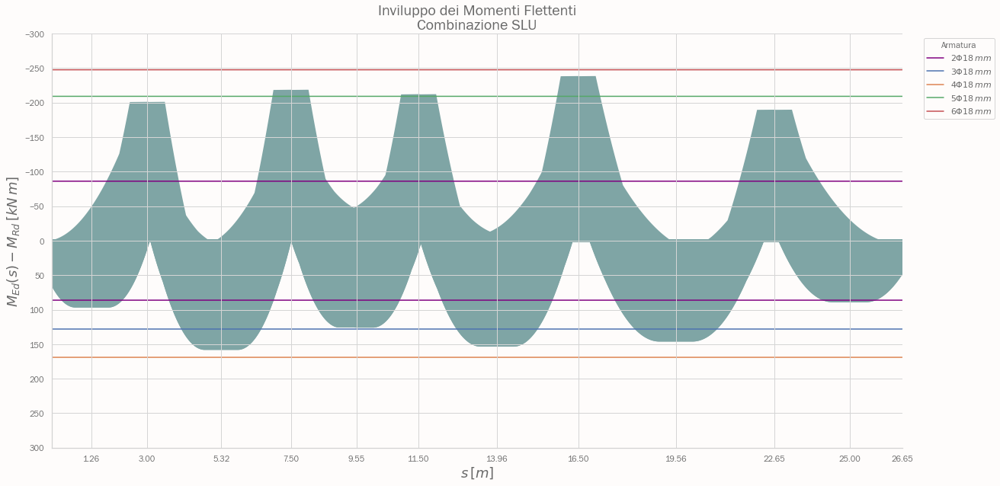

In [56]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s1m, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s1p, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s2p, Mmin, linewidth='3', color='#7FA5A5')
plt.fill(s2m, Mmin, linewidth='3', color='#7FA5A5')

plt.plot(s, max(MRd_neg)*np.ones(len(s)), color='purple', label=r'$2\Phi 18\,mm$')
plt.plot(s, -max(MRd_neg)*np.ones(len(s)), color='purple')

labels = [r'$3\Phi 18\,mm$', r'$4\Phi 18\,mm$']
labels1 = [r'$5\Phi 18\,mm$', r'$6\Phi 18\,mm$']

for y_arr, label in zip(np.unique(MRd_pos[0::2]), labels):
    plt.plot(s,y_arr*np.ones(len(s)), label=label)
    
for y_arr, label in zip(np.unique(MRd_pos[1::2]), labels1):
    plt.plot(s,-y_arr*np.ones(len(s)), label=label)

plt.legend(bbox_to_anchor=(1.02,1), title='Armatura')
plt.xlim(s.min(), s.max())
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$M_{Ed}(s) - M_{Rd} \,[kN\,m]$',)
plt.xticks(ss)
plt.yticks(np.arange(-300, 350, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
plt.savefig('export/img/MEd-MRd_traslato_beam_slu.pdf', bbox_inches='tight')
plt.show()

In [57]:
s = np.arange(0,26.65, .001)

s1 = s+ 518/1000
for i in range (0, len(s)):
    if s1[i] > 26.65:
        s1[i] = 26.65

s2 = s- 518/1000
for i in range (0, len(s)):
    if s2[i] < 0:
        s2[i] = 0

sc1 = np.array([s2[1260], s1[1260]])
Mc1 = Mmax[1260]*np.ones(len(sc1))

sc2 = np.array([s2[5320], s1[5320]])
Mc2 = Mmax[5320]*np.ones(len(sc2))

sc3 = np.array([s2[9550], s1[9550]])
Mc3 = Mmax[9550]*np.ones(len(sc2))

sc4 = np.array([s2[13960], s1[13960]])
Mc4 = Mmax[13960]*np.ones(len(sc2))

sc5 = np.array([s2[19560], s1[19560]])
Mc5 = Mmax[19560]*np.ones(len(sc2))

sc6 = np.array([s2[25000], s1[25000]])
Mc6 = Mmax[25000]*np.ones(len(sc2))

#-------------------------------------------------

sn2 = np.array([s2[3000], s1[3000]])
Mn2 = Mmin[3000]*np.ones(len(sc1))

sn3 = np.array([s2[7500], s1[7500]])
Mn3 = Mmin[7500]*np.ones(len(sc2))

sn4 = np.array([s2[11500], s1[11500]])
Mn4 = Mmin[11500]*np.ones(len(sc2))

sn5 = np.array([s2[16500], s1[16500]])
Mn5 = Mmin[16500]*np.ones(len(sc2))

sn6 = np.array([s2[22650], s1[22650]])
Mn6 = Mmin[22650]*np.ones(len(sc2))

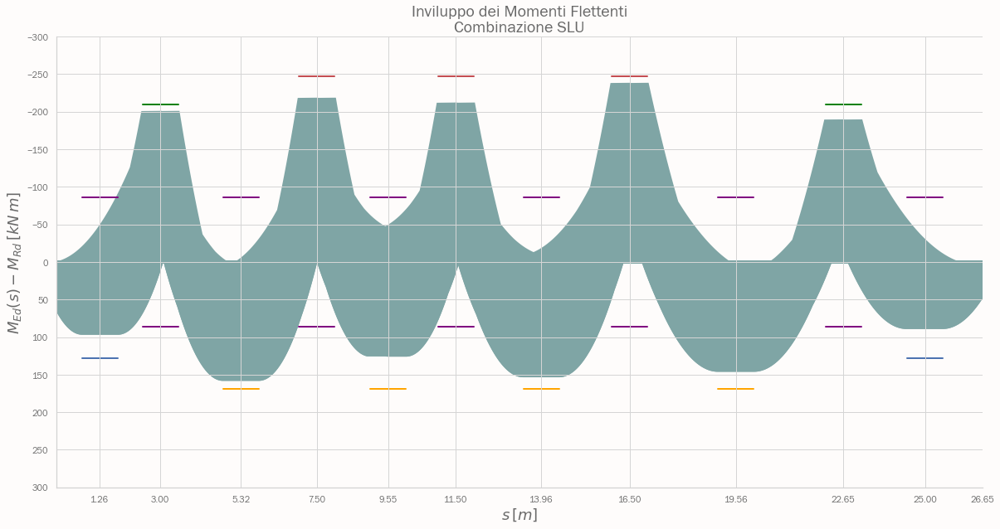

In [75]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s1m, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s1p, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s2p, Mmin, linewidth='3', color='#7FA5A5')
plt.fill(s2m, Mmin, linewidth='3', color='#7FA5A5')

#---------------- MRd+ -------------------
plt.plot(sc1, MRd_pos[0]*np.ones(len(sc1)), linewidth='2', color='b')
plt.plot(sn2, -MRd_pos[1]*np.ones(len(sc1)), linewidth='2', color='green')
plt.plot(sc2, MRd_pos[2]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn3, -MRd_pos[3]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc3, MRd_pos[4]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn4, -MRd_pos[5]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc4, MRd_pos[6]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn5, -MRd_pos[7]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc5, MRd_pos[8]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn6, -MRd_pos[9]*np.ones(len(sc1)), linewidth='2', color='green')
plt.plot(sc6, MRd_pos[10]*np.ones(len(sc1)), linewidth='2', color='b')

#---------------- MRd- -------------------
plt.plot(sc1, -MRd_neg[0]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn2, MRd_neg[1]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc2, -MRd_neg[2]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn3, MRd_neg[3]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc3, -MRd_neg[4]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn4, MRd_neg[5]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc4, -MRd_neg[6]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn5, MRd_neg[7]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc5, -MRd_neg[8]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn6, MRd_neg[9]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc6, -MRd_neg[10]*np.ones(len(sc1)), linewidth='2', color='purple')


plt.xlim(s.min(), s.max())
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$M_{Ed}(s) - M_{Rd} \,[kN\,m]$',)
plt.xticks(ss)
plt.yticks(np.arange(-300, 350, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
#plt.savefig('export/img/MEd-MRd_traslato_beam_slu.pdf', bbox_inches='tight')
# plt.savefig('/mnt/c/Users/anzo5/MEd-MRd_traslato.pdf', bbox_inches='tight')
plt.show()

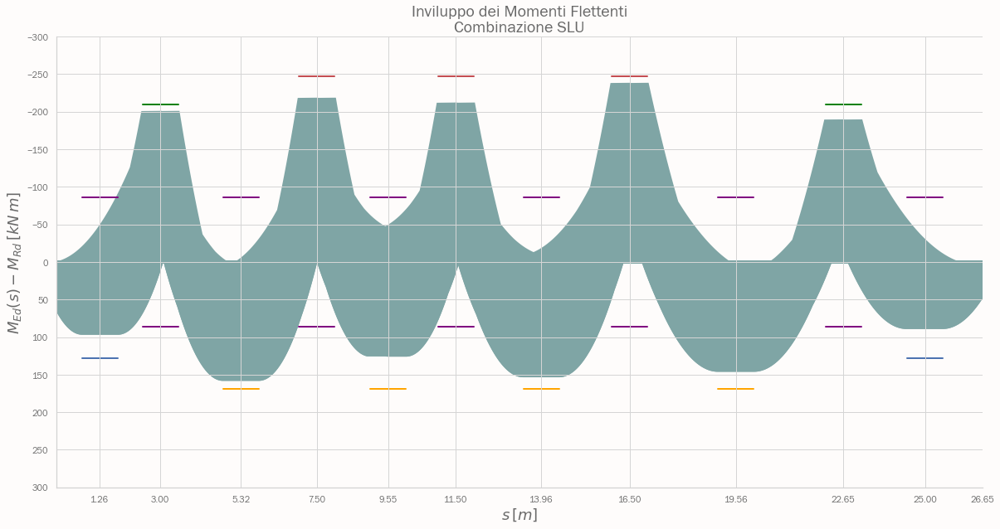

In [76]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s1m, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s1p, Mmax, linewidth='3', color='#7FA5A5')
plt.fill(s2p, Mmin, linewidth='3', color='#7FA5A5')
plt.fill(s2m, Mmin, linewidth='3', color='#7FA5A5')

#---------------- MRd+ -------------------
plt.plot(sc1, MRd_pos[0]*np.ones(len(sc1)), linewidth='2', color='b')
plt.plot(sn2, -MRd_pos[1]*np.ones(len(sc1)), linewidth='2', color='green')
plt.plot(sc2, MRd_pos[2]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn3, -MRd_pos[3]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc3, MRd_pos[4]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn4, -MRd_pos[5]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc4, MRd_pos[6]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn5, -MRd_pos[7]*np.ones(len(sc1)), linewidth='2', color='#C44E52')
plt.plot(sc5, MRd_pos[8]*np.ones(len(sc1)), linewidth='2', color='orange')
plt.plot(sn6, -MRd_pos[9]*np.ones(len(sc1)), linewidth='2', color='green')
plt.plot(sc6, MRd_pos[10]*np.ones(len(sc1)), linewidth='2', color='b')

#---------------- MRd- -------------------
plt.plot(sc1, -MRd_neg[0]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn2, MRd_neg[1]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc2, -MRd_neg[2]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn3, MRd_neg[3]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc3, -MRd_neg[4]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn4, MRd_neg[5]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc4, -MRd_neg[6]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn5, MRd_neg[7]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc5, -MRd_neg[8]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sn6, MRd_neg[9]*np.ones(len(sc1)), linewidth='2', color='purple')
plt.plot(sc6, -MRd_neg[10]*np.ones(len(sc1)), linewidth='2', color='purple')


plt.xlim(s.min(), s.max())
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$M_{Ed}(s) - M_{Rd} \,[kN\,m]$',)
plt.xticks(ss)
plt.yticks(np.arange(-300, 350, step=50))
plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
#plt.savefig('export/img/MEd-MRd_traslato_beam_slu.pdf', bbox_inches='tight')
# plt.savefig('/mnt/c/Users/anzo5/MEd-MRd_traslato.pdf', bbox_inches='tight')
plt.show()

In [77]:
os.getcwd()

'c:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC'

In [78]:
sc1[1] - sc1[0]  + lbd/1000 + sc1[0]

2.54400000000000

# Lunghezze di ancoraggio

In [ ]:
alpha1, alpha2, alpha3, alpha4, alpha5 = 1, 1, 1, 1, 1

In [ ]:
sigmasd = fyd
alphact = .85
fctm = 2.57
fctk005 = round(.7*fctm,1)
eta1 = 1 #buona aderenza
eta2 = 1 #Phi < 32mm
fctd = alphact * fctk005/gammac
fbd = 2.25 * eta1 * eta2 * fctd
fbd = round(fbd,1)
fbd

In [ ]:
lbrqd = Phi0/4 * (sigmasd/fbd)
print(lbrqd)
lbrqd = ceiling(lbrqd)
print(lbrqd)

In [ ]:
lbmin = np.array([ceiling(max(.3*lbrqd, 10*Phi0, 100)), ceiling(max(.6*lbrqd, 10*Phi0, 100))]) #[trazione, compressione]
lbmin

In [ ]:
lbd = alpha1*alpha2*alpha3*alpha4*alpha5*lbrqd
lbd

In [ ]:
len(lbmin)

In [ ]:
for i in range (len(lbmin)):
    print('lbd > lbmin\t', lbd > lbmin[i])

Allora
$$l_{bd} = 769.19\,mm \simeq 770\,mm$$

In [ ]:
a = (300-2*20-2*10-6*18)/(5)
a

In [ ]:
#c1 = c = 20mm
cd = min(a/2, 20,20)
cd

In [ ]:
alpha2 = min(1-0.15*(cd - Phi0)/Phi0, 1)
alpha2

---
# Taglio

In [ ]:
# Vmax = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Vmax.txt') #Linux
# Vmin = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Vmin.txt') #Linux
# VEd_slu = pd.read_csv('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/VEd_slu.csv') #Linux

Vmax = np.loadtxt('C:\\Users\\anzo5\\TdC\\Esercitazione\\TdC\\export\\var\\Vmax.txt') #Windows
Vmin = np.loadtxt('C:\\Users\\anzo5\\TdC\\Esercitazione\\TdC\\export\\var\\Vmin.txt') #Windows
VEd_slu = pd.read_csv('C:\\Users\\anzo5\\TdC\\Esercitazione\\TdC\\export\\var\\VEd_slu.csv') #Windows
VEd_slu.to_latex('VEd_slu.tex')
VEd_slu

In [ ]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s, Vmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Vmin, linewidth='3', color='#7FA5A5')

plt.xlim(s.min(), s.max())
#plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$V_{Ed}(s)\,[kN\,m]$',)
plt.xticks(ss)
plt.yticks(np.arange(-300, 350, step=50))
plt.title('Inviluppo dei Tagli\nCombinazione SLU',)
# plt.savefig('export/img/shearEnvelopeBeam_slu')
plt.show()

In [ ]:
cot_theta, Asw, s, rho_l, theta = symbols('cot_theta, Asw, s, rho_l, theta')
d = 460;
gammac = 1.5
fck = 450;
fyd = round(fck/1.15,2);
fck = 25;
fcd = .85*fck/gammac;
b = 300;
Phi_l = 18; #mm


VEd = [150.59, 245.457, 286.437, 286.33, 272.636, 266.498, 266.79, 261.915, 246.693, 202.222, 208.848, 105.286];
len(VEd)
Matrix(VEd)

---
## Sezione non armata a taglio

In [ ]:
Matrix(As0)

In [ ]:
rho_l = 1/(b*d) * As0
rho_l = rho_l.tolist()
rho_l

In [ ]:
for i in range (len(rho_l)):
    print(latex(np.array(N(rho_l[i]))))


In [ ]:
VRdc = np.zeros(len(rho_l))
for i in range (0, len(rho_l)):
    VRdc[i] = max(.18*min(1+(200/d)**(1/2), 2) * (100*rho_l[i]*fck)**(1/3) /gammac * b*d, b*d*.035*min(1+(200/d)**(1/2), 2)*fck**(1/2))/1000

Matrix(VRdc)

In [ ]:
for i in range (0, len(VRdc)):
    if VRdc[i] > VEd[i]:
        print('N{}: Armatura a taglio non necessaria'.format(i+1))
    else:
        print('N{}: Armatura a taglio necessaria'.format(i+1))

In [ ]:
VRdmax = .5*1*b*.9*d*fcd*cot_theta/(1+(cot_theta)**2)/1000
VRdmax

In [ ]:
VRds = Asw/s * .9*d*fyd*cot_theta/1000
VRds

---
## Resistenza a taglio massima

La resistenza a taglio massima lato calcestruzzo si ha per $\theta = \dfrac{\pi}{4}$ e cioè per $\cot\theta = 1$

In [ ]:
VRcmax = VRdmax.subs({cot_theta:1})
print(VRcmax,'kN')

Controllo che il massimo taglio esplicabile dalla sezione sia maggiore del taglio sollecitante: il massimo taglio resistente lato calcestruzzo si ha per $\cot\theta = 1$ cioè per $\theta=\dfrac{\pi}{4}$

In [ ]:
VRcmax > max(VEd)

Ok, la sezione è in grado di assorbire il taglio sollecitante e non c'è bisogno di cambiare le dimensioni della sezione o di aumentare la classe del calcestruzzo!

In [ ]:
max(VEd)

---
## Sezione armata a taglio

In [ ]:
Asw_min = 1.5*b
s_max = min(.8*d, 1000/3, 15*Phi_l)
print(Asw_min,'mm^2\n', s_max,'mm')

Si scelgono barre $\Phi\,8\,mm$ con $2$ bracci. L'area delle staffe è

In [ ]:
nb = 2
Asw0 = nb*area(8)
Asw0

Sono necessarie perciò

In [ ]:
print(N(Asw_min/Asw0),'barre per metro\n',
ceiling(Asw_min/Asw0),'barre per metro')

con un passo di 

In [ ]:
print(N(1000/(Asw_min/Asw0)),'mm\n',
      floor(1000/(Asw_min/Asw0) /10)*10,'mm')

In [ ]:
s0 = floor(1000/(Asw_min/Asw0) /10)*10 
print(s0)
s0 < s_max

OK, il passo è accettabile! Posso usare questo passo e questa armatura per armare la parte centrale della trave dove non è necessaria un'armatura a taglio specifica.

L'armatura a taglio interna è $\Phi 8\,mm$ passo $220\,mm$.

### Taglio resistente dell'armatura minima (trave interna)

Il valore dell'angolo del puntone inclinato in questa sezione si ricava ponendo $V_{Rd,max} = V_{Rd,s}$, considerando le condizioni di rottura

In [ ]:
theta0 = solve(VRds.subs({cot_theta:cot(theta), Asw:Asw0, s:s0}) - VRdmax.subs({cot_theta:cot(theta)}), theta)[1]

print(theta0,'rad=',deg(theta0),'deg')
deg(theta0) >= 21.8

L'angolo $\theta < \theta_{min}$. Si deve scegliere
$$ \theta = 21.8\deg$$
Il taglio resistente per il meccanismo che si sviluppa con l'angolo $\theta$ appena fissato è

In [ ]:
theta_min = rad(21.8)
print(N(VRds.subs({cot_theta:round(cot(theta_min),2), Asw:Asw0, s:s0})),'kN')
print(VRdmax.subs({cot_theta:round(cot(theta_min),2)}),'kN')

Il valore del taglio resistente è il minimo tra il taglio trazione e il taglio compressione

In [ ]:
print(N(min(VRds.subs({cot_theta:round(cot(theta_min),2), Asw:Asw0, s:s0}), VRdmax.subs({cot_theta:round(cot(theta_min),2)}))), 'kN')

cioè il valore di $V_{Rd,s}$.

### Armatura a taglio sugli appoggi

Sugli appoggi l'armatura a taglio va infittita.

L'angolo $\theta$ vale

In [ ]:
thetaEd = np.zeros(len(VEd))
for i in range(0, len(VEd)):
    thetaEd[i] = (float(solve(VRdmax.subs({cot_theta:cot(theta)}) - VEd[i], theta)[0]))
    print(thetaEd[i],'rad = ',
          N(deg(thetaEd[i])),
        'deg'
    )
    if thetaEd[i] < rad(21.8):
        thetaEd[i] = rad(21.8)

print('\n\n')
for i in range(0, len(VEd)):
    print(thetaEd[i],'rad = ', N(deg(thetaEd[i])),'deg')

Poiché gli angoli sono minori di $\theta_{min} = 21.8\deg$, si sceglie l'angolo minimo come angolo di progetto. Con $\theta = 21.8\deg$ si calcola il passo, che deve essere inferiore del passo massimo $s_{max} = 270\,mm$


In [ ]:
sd = np.zeros(len(VEd))
for i in range(0, len(VEd)):
    sd[i] = floor(float(solve(VRds.subs({cot_theta:cot(thetaEd[i]), Asw:Asw0}) - VEd[i], s)[0])/10)*10
    if sd[i] >= s_max:
        sd[i] = s0
    print(sd[i],'mm')
    
sd

### Verifica

Per prima cosa si calcola il valore di $\theta$ a rottura $V_{Rd,s} = V_{Rd,max}$ con i valori di $s$ appena trovati. Il valore dell'angolo deve sempre essere $\theta \geq 21.8\deg$

In [ ]:
thetad = np.zeros(len(thetaEd))
for i in range(0, len(sd)):
    thetad[i] = float(solve(VRds.subs({cot_theta:cot(theta), Asw:Asw0, s:sd[i]}) - VRdmax.subs({cot_theta:cot(theta)}), theta)[1])
    print(#thetad[i],'rad = ', 
        round(N(deg(thetad[i])),2)
    #    ,'deg'
    )
    if thetad[i] < rad(21.8):
        thetad[i] = rad(21.8)

print('\n\n')
for i in range(0, len(VEd)):
    print(thetad[i],'rad = ', N(deg(thetad[i])),'deg')

In [ ]:
VRds_d = np.zeros(len(VEd))
VRdmax_d = np.zeros(len(VEd))
for i in range(0, len(thetad)):
    VRds_d [i] = (VRds.subs({cot_theta:cot(thetad[i]), Asw:Asw0, s:sd[i]}))
    VRdmax_d [i] = VRdmax.subs({cot_theta:cos(thetad[i])})
for i in range(0, len(thetad)):
    print('\nVRds[kN]\t\tVRdmax[kN]\t\t\tVEd[kN]\n',VRds_d[i], '\t',VRdmax_d[i],'\t>\t', VEd[i])
    if VRds_d[i] > VEd[i]:
        print('True')
    else:
        print('False')

In [ ]:
Matrix(VRdmax_d)

Il taglio resistente è quello lato acciaio e vale

In [ ]:
VRd = np.zeros(len(VEd))
for i in range(0, len(VEd)):
    VRd[i] = min(VRds_d[i], VRdmax_d[i])
    print(VRd[i], 'kN')

In [ ]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s, Vmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Vmin, linewidth='3', color='#7FA5A5')


labels = list()
labels1 = list()
for i in range(0, len(sd[0::2])):
    labels.append('s:%i mm' %sd[0::2][i])
    
for i in range(0, len(sd[1::2])):
    labels1.append('s:%i mm' %sd[1::2][i])

for y_arr, label in zip(np.unique(VRd[0::2]), labels):
    plt.plot(s,y_arr*np.ones(len(s)), label=label)
    
for y_arr, label in zip(np.unique(VRd[1::2]), labels1):
    plt.plot(s,-y_arr*np.ones(len(s)), label=label)

plt.legend(bbox_to_anchor=(1, 1), title='Staffe ɸ8.\nSpaziatura staffe:')
plt.xlim(s.min(), s.max())
#plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$V_{Ed}(s) - V_{Rd}\,[kN]$',)
plt.xticks(ss, fontsize='16')
plt.yticks(np.arange(-300, 350, step=50), fontsize='16')
plt.title('Inviluppo dei Tagli\nCombinazione SLU',)
#plt.savefig('export/img/VEd-VRd.pdf', bbox_inches='tight')
plt.show()

In [ ]:
sd

In [ ]:
s = np.arange(0,26.65, .001)
fig = plt.figure(figsize=(20,10))
plt.fill(s, Vmax, linewidth='3', color='#7FA5A5')
plt.fill(s, Vmin, linewidth='3', color='#7FA5A5')

plt.plot(sc1, -VRd[0]*np.ones(len(sc1)), color='blue')
plt.plot(sc1, VRd[0]*np.ones(len(sc1)), color='blue', label='s=220 mm')

plt.plot(sn2, -VRd[1]*np.ones(len(sn2)), color='red',  label='s=160 mm')
plt.plot(sn2, VRd[2]*np.ones(len(sn2)), color='green', label='s=140 mm')

plt.plot(sc2, -VRd[0]*np.ones(len(sc2)), color='blue')
plt.plot(sc2, VRd[0]*np.ones(len(sc2)), color='blue', )

plt.plot(sn3, -VRd[3]*np.ones(len(sn3)), color='green',)
plt.plot(sn3, VRd[4]*np.ones(len(sn3)), color='green',)

plt.plot(sc3, -VRd[0]*np.ones(len(sc3)), color='blue')
plt.plot(sc3, VRd[0]*np.ones(len(sc3)), color='blue', )

plt.plot(sn4, -VRd[5]*np.ones(len(sn4)), color='purple',label = 's=150 mm')
plt.plot(sn4, VRd[6]*np.ones(len(sn4)),color='purple')

plt.plot(sc4, -VRd[0]*np.ones(len(sc4)), color='blue')
plt.plot(sc4, VRd[0]*np.ones(len(sc4)), color='blue', )

plt.plot(sn5, -VRd[7]*np.ones(len(sn5)),color='purple')
plt.plot(sn5, VRd[8]*np.ones(len(sn5)),color='red')

plt.plot(sc5, -VRd[0]*np.ones(len(sc5)), color='blue')
plt.plot(sc5, VRd[0]*np.ones(len(sc5)), color='blue', )

plt.plot(sn6, -VRd[9]*np.ones(len(sn6)), color='cyan',  label='s=200 mm')
plt.plot(sn6, VRd[10]*np.ones(len(sn6)), color='pink', label='s=190 mm')

plt.plot(sc6, -VRd[0]*np.ones(len(sc6)), color='blue')
plt.plot(sc6, VRd[0]*np.ones(len(sc6)), color='blue', )

plt.legend(bbox_to_anchor=(1, 1), title='Staffe ɸ8.\nSpaziatura staffe:', fontsize='14')
plt.xlim(s.min(), s.max())
#plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$',)
plt.ylabel(r'$V_{Ed}(s) - V_{Rd}\,[kN]$',)
plt.xticks(ss, fontsize='16')
plt.yticks(np.arange(-300, 350, step=50), fontsize='16')
plt.title('Inviluppo dei Tagli\nCombinazione SLU',)
plt.savefig('export/img/VEd-VRd.pdf', bbox_inches='tight')
plt.show()

---
# SLE
## Stato limite di limitazione delle tensioni

In [ ]:
Matrix(As0)

In [ ]:
MEd_rara = [44.88, 124.53, 87.16, 130.77, 49.51, 121.15, 76.75, 148.80, 79.76, 117.97, 41.99]
Matrix(MEd_rara)

In [ ]:
MEd_qp = [29.18, 86.73, 58.92, 90.00, 29.90, 83.75, 52.16, 115.07, 63.74, 95.72, 31.89]
Matrix(MEd_qp)

In [ ]:
MEd_freq = [31.31, 91.54, 62.64, 95.10, 32.46, 88.39, 55.20, 119.52, 65.94, 98.81, 33.20]
Matrix(MEd_freq)

In [ ]:
x0 = np.zeros(len(As0))
for i in range (len(As0)):
    x0[i] = N(solve(b*x**2 /2 + n*A1s0[i]*(x-d2) - n*As0[i]*(d0-x), x)[0])
    
Matrix(x0)

In [ ]:
Inn = np.zeros(len(As0))
for i in range (len(As0)):
    Inn[i] = N(b*x0[i]**3 /12 + n*A1s0[i]*(x0[i]-d2)**2 + n*As0[i]*(d0-x0[i])**2)
    
Matrix(Inn)

In [ ]:
sigmac_rara = np.zeros(len(As0))
for i in range (len(As0)):
    sigmac_rara[i] = N((MEd_rara[i]*10**6/Inn[i])*x0[i])
    
Matrix(sigmac_rara)

In [ ]:
sigmas_rara = np.zeros(len(As0))
for i in range (len(As0)):
    sigmas_rara[i] = N(n*sigmac_rara[i]*(d0-x0[i])/x0[i])
    
Matrix(sigmas_rara)

In [ ]:
sigma1s_rara = np.zeros(len(As0))
for i in range (len(As0)):
    sigma1s_rara[i] = N(n*sigmac_rara[i]*(x0[i]-d2)/x0[i])
    
Matrix(sigma1s_rara)

In [ ]:
sigmac_qp = np.zeros(len(As0))
for i in range (len(As0)):
    sigmac_qp[i] = N((MEd_qp[i]*10**6/Inn[i])*x0[i])
    
Matrix(sigmac_qp)

In [ ]:
sigmas_qp = np.zeros(len(As0))
for i in range (len(As0)):
    sigmas_qp[i] = N(n*sigmac_qp[i]*(d0-x0[i])/x0[i])
    
Matrix(sigmas_qp)

In [ ]:
sigma1s_qp = np.zeros(len(As0))
for i in range (len(As0)):
    sigma1s_qp[i] = N(n*sigmac_qp[i]*(x0[i]-d2)/x0[i])
    
Matrix(sigma1s_qp)

In [ ]:
sigmac_freq = np.zeros(len(As0))
for i in range (len(As0)):
    sigmac_freq[i] = N((MEd_freq[i]*10**6/Inn[i])*x0[i])
    
Matrix(sigmac_freq)

In [ ]:
sigmas_freq = np.zeros(len(As0))
for i in range (len(As0)):
    sigmas_freq[i] = N(n*sigmac_freq[i]*(d0-x0[i])/x0[i])
    
Matrix(sigmas_freq)

In [ ]:
sigma1s_freq = np.zeros(len(As0))
for i in range (len(As0)):
    sigma1s_freq[i] = N(n*sigmac_freq[i]*(x0[i]-d2)/x0[i])
    
Matrix(sigma1s_freq)

In [ ]:
print('SLE RARA:\n')
for i in range (len(As0)):
    if sigmac_rara[i] <= sigmacR_rara and sigmas_rara[i] <= sigmasR_rara and sigma1s_rara[i] <= sigmasR_rara:
        print('Verificata\n')
    else:
        print('Sezione non verificata! Riprogettare la sezione agli SLE\n')

print('SLE QUASI PERMANENTE :\n')
for i in range (len(As0)):
    if sigmac_qp[i] <= sigmacR_qp:
        print('Verificata\n')
    else:
        print('Sezione non verificata! Riprogettare la sezione agli SLE\n')
        

---
## Stato limite di fessurazione

### Momento di prima fessurazione


In [ ]:
h = d0 + d1
alphae = Es/Ecm
kt_freq = 0.6
kt_qp = .4

In [ ]:
Matrix(x0)

In [ ]:
x1 = np.zeros(len(As0))
for i in range (len(As0)):
    x1[i] = N(solve(b*x**2 /2 -b*(h-x)**2 /2 + n*A1s0[i]*(x-d2) - n*As0[i]*(d0-x), x)[0])

Matrix(x1)

In [ ]:
Matrix(Inn)

In [ ]:
Inn1 = np.zeros(len(As0))
for i in range (len(As0)):
    Inn1[i] = N(b*x1[i]**3 /12 + b*(h-x1[i])**3 /12 + n*A1s0[i]*(x1[i]-d2)**2 + n*As0[i]*(d0-x1[i])**2)
    
Matrix(Inn1)

In [ ]:
Inn[7:-1]/10**9

In [ ]:
x0[7:-1]

In [ ]:
Inn1[7:-1]/10**9

In [ ]:
x1[7:-1]

In [ ]:
sigmact = round(fctm/1.2,2)
Mcr = np.ones(len(As0))

for i in range (len(As0)):
    Mcr[i] = sigmact* (Inn1[i]/(h-x1[i]))/(10**6)

Matrix(Mcr)

In [ ]:
for i in range (0,len(As0),2):
    if Mcr[i] < MEd_freq[i]:
        print('Trave fessurata per la combinazione frequente')
    else:
        print('Trave non fessurata per la combinazione frequente')

print('\n')

for i in range (0,len(As0),2):
    if Mcr[i] < MEd_qp[i]:
        print('Trave fessurata per la combinazione quasi permanente')
    else:
        print('Trave non fessurata per la combinazione quasi permanente')

In [ ]:
hceff = np.zeros(len(As0))
Aceff = np.zeros(len(As0))
rhoeff = np.zeros(len(As0))

for i in range (len(As0)):
    hceff[i] = min(2.5*(h-d0), (h-x1[i])/3, h/2)
    
for i in range (len(As0)):
    Aceff[i] = b* hceff[i]
    
for i in range (len(As0)):
    rhoeff[i] = As0[i]/Aceff[i]
    

Matrix(Aceff);
Matrix(hceff)
Matrix(rhoeff)

In [ ]:
epsilonsm_freq = np.zeros(len(As0))
for i in range (len(As0)):
    epsilonsm_freq[i] = max((sigmas_freq[i] - kt_freq*(fctm/rhoeff[i])*(1+alphae*rhoeff[i]))/Es, .6*(sigmas_freq[i]/Es))
    
Matrix(epsilonsm_freq)

In [ ]:
epsilonsm_qp = np.zeros(len(As0))
for i in range (len(As0)):
    epsilonsm_qp[i] = max((sigmas_qp[i] - kt_qp*(fctm/rhoeff[i])*(1+alphae*rhoeff[i]))/Es, .6*(sigmas_qp[i]/Es))
    
Matrix(epsilonsm_qp)

In [ ]:
c = 20
Phist=8
N(b-2*c -nb * Phist - nums[8]*Phi0)/(nums[8]-1)

In [ ]:
c = 20;
Phist = 8
k1=.8 #barre ad aderenza migliorata. k1 = 1.6 per barre lisce
k2 = .5 #flessione. k2 = 1 per trazione semplice
k3 = 3.4
k4 = .425

Deltasm = 0*As0
for i in range(len(As0)):
    if N(b-2*c -nb * Phist - nums[i]*Phi0)/(nums[i]-1) < 5*(c+ Phi0/2):
        Deltasm[i] = (k3*c + k1*k2*k4*(Phi0/rhoeff[i]))/1.7
    
Matrix(Deltasm)

In [ ]:
wk_freq = 0*As0
wk_qp = 0*As0

for i in range(len(As0)):
    wk_freq[i] = 1.7*epsilonsm_freq[i] * Deltasm[i]
    wk_qp[i] = 1.7*epsilonsm_qp[i] * Deltasm[i]
    
Matrix(wk_freq)

In [ ]:
Matrix(wk_qp)

Considerando che l'edificio si trova in Provincia di Trento a un'altitudine di 788 m ed essendo la trave un elemento divisorio tra ambiente esterno ed interno, si sceglie una classe di esposozione ambientale - secondo la EC2 - XC3: umidità moderata. La classe ricade nelle condizioni ambientali ordinarie per cui i limiti imposti dalla normativa italiana sono:
$$
\begin{cases}
w_k^{freq} \leq w_3 = 0.4\\
w_k^{QP} \leq w_2 = 0.3
\end{cases} 
$$

In [ ]:
w3 = .4
w2 = .3;

for i in range (len(As0)):
    if wk_freq[i] <= w3:
        print('Sezione verifiata per la combinazione frequente!')
    else:
        print('Sezione non verifiata per la combinazione frequente! Riprogettare')
        
for i in range (len(As0)):
    if wk_qp[i] <= w2:
        print('Sezione verifiata per la combinazione quasi permanente!')
    else:
        print('Sezione non verifiata per la combinazione quasi permanente! Riprogettare')
    

In [ ]:
pd.DataFrame([
    ['Combinazione',
    r'$M_{Ed}^{freq}[kN\,m]$',
    r'$\sigma_s\,[MPa]$',
    r'$s\,[mm]$'],
    [
        'Frequente',
        65.94,
        180,
        57.33
    ],
    [
        'Quasi permanente',
        65.94,
        180,
        57.33
    ]
])

In [ ]:
Mmax_qp = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmax_qp.txt') #Linux
#Mmax_qp = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmax.txt') #Windows
Mmin_qp = np.loadtxt('/mnt/c/Users/anzo5/ownCloud/UNITN/Tecnica-delle-Costruzioni/Esercitazione/TdC/export/var/Mmin_qp.txt') #Linux
#Mmin_qp = np.loadtxt('C:\\Users\\anzo5\\ownCloud\\UNITN\\Tecnica-delle-Costruzioni\\Esercitazione\\TdC\\export\\var\\Mmin.txt')#Windows

In [ ]:
s = np.arange(0,26.65, .001)
fig, ax = plt.subplots(figsize=(20,10))
plt.fill(s, Mmax_qp, linewidth='3', color='#7FA5A5')
plt.fill(s, Mmin_qp, linewidth='3', color='#7FA5A5')
ax.set_xlim(1,10)
plt.gca().invert_yaxis()
plt.grid()
plt.xlabel(r'$s\,[m]$')
plt.ylabel(r'$M_{Ed}(s)\,[kN\,m]$')
plt.xticks(ss)
plt.yticks(np.arange(-150, 100, step=50))
#plt.title('Inviluppo dei Momenti Flettenti\nCombinazione SLU',)
#plt.savefig('export/img/bendingMomentEnvelopeBeam_slu.eps')
plt.show()

In [ ]:
s = np.arange(0,26.65, .001)
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = s,
    y = Mmax_qp,
    name='M+',
    line_color='#7FA5A5',
    showlegend=False,
    line = dict(width=1)
))

fig.add_trace(go.Scatter(
    x = s,
    y = Mmin_qp,
    name='M-',
    line_color='#7FA5A5',
    fill='tonexty',
    showlegend=False,
    line = dict(width=1)
))


fig.add_trace(go.Scatter(
    x = [16.50, 17.50], 
    y = -22.32*np.ones(len(sn5)),
    line_color='red',
    name=r'$M_{cr}^{N5}$'
))

fig.add_trace(go.Scatter(
    x = [18.1, 21.25], 
    y = 19.12*np.ones(len(sc5)),
    line_color='blue',
    name=r'$M_{cr}^{C5}$'
))

fig.add_trace(go.Scatter(
    x = [21.85, 22.65], 
    y = -20.72*np.ones(len(sn6)),
    line_color='green',
    name=r'$M_{cr}^{N6}$'
))



fig.update_yaxes(autorange="reversed")
fig.update_traces(mode='lines')
fig.update_layout(
    title_text=('Inviluppo dei momenti flettenti<br>' + 'Combinazione SLE quasi permanente'),
    title_x=.5,
    autosize=True,
    xaxis = dict(
        tickmode='array',
        tickvals=ss,
        ticktext=ss,
        title=r'$s\,[m]$',
    ),
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 10,
        title=r'$M_{Ed}\,[kN\,m]$'
    ),
    xaxis_showgrid=True, 
    yaxis_showgrid=True,
)

fig.write_image("export/img/bendingMoment_C5_slu.pdf")

fig.update_yaxes(automargin=True)
fig.show()